In [2]:
import numpy as np
import pandas as pd
import plotly.express as px
import cufflinks as cf
from tqdm.autonotebook import tqdm
import random
import plotly.graph_objects as go
from plotly.subplots import make_subplots

D:\miniconda3\envs\timeseries\lib\site-packages\ipykernel_launcher.py:5: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



In [3]:
def relative_absolute_error(a,f, f_star):
    return np.abs(a-f)/(a-f_star)

def absolute_scaled_error(a,f, scale):
    return np.abs(a-f)/scale


## Loss Curves

In [4]:
actuals = np.arange(0,10)
forecast = np.arange(0,10)
forecast_star = np.arange(0,10)

scale = 1

In [5]:
a=20
res_l = []
for e in np.arange(-10,11,1):
    f = a-e
    for f_star in forecast_star:
            res_l.append({
                "e":e,
                "f_star": f_star,
                "rae" : relative_absolute_error(a,f,f_star),
                "ase" : absolute_scaled_error(a,f,scale),
            })

In [6]:
res_df = pd.DataFrame(res_l)
res_df.sample(10)

,e,f_star,rae,ase
189,8,9,0.727273,8.0
32,-7,2,0.388889,7.0
25,-8,5,0.533333,8.0
20,-8,0,0.400000,8.0
103,0,3,0.000000,0.0
146,4,6,0.285714,4.0
153,5,3,0.294118,5.0
53,-5,3,0.294118,5.0
9,-10,9,0.909091,10.0
196,9,6,0.642857,9.0


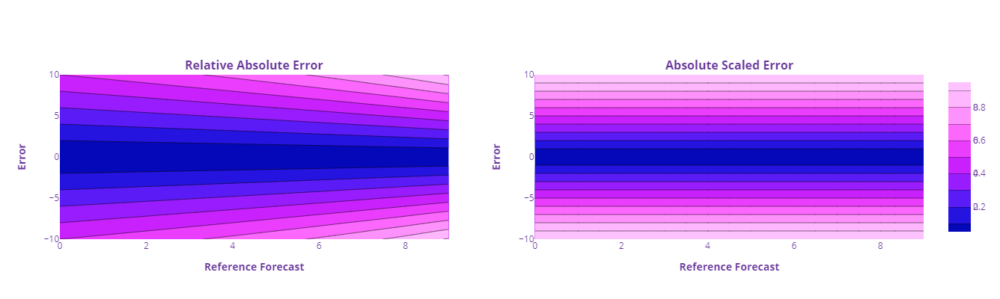

In [7]:
plots={}
for col in ['rae', 'ase']:
    plot_df = pd.pivot_table(res_df, index="e", columns="f_star", values=col)
    f = go.Contour(
            z=plot_df.values,
            x=plot_df.columns, # horizontal axis
            y=plot_df.index, # vertical axis
            showscale = True,
            colorscale='Plotly3',
        )
    plots[col] = f

# Initialize figure with subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("<b>Relative Absolute Error</b>", "<b>Absolute Scaled Error</b>"),
)    


fig.add_trace(plots['rae'],
             row=1, col=1)
fig.update_yaxes(title_text="<b>Error</b>", row=1, col=1)
fig.update_xaxes(title_text="<b>Reference Forecast</b>", row=1, col=1)
fig.add_trace(plots['ase'],
             row=1, col=2)
fig.update_yaxes(title_text="<b>Error</b>", row=1, col=2)
fig.update_xaxes(title_text="<b>Reference Forecast</b>", row=1, col=2)

fig.update_layout(
    height=400,width=900,
        font=dict(
            color="RebeccaPurple"
        )
    )
fig.show()

In [8]:
plot_df = pd.pivot_table(res_df, index="e", columns="f_star", values="rae")

In [11]:
z=plot_df.values #RAE
y=plot_df.index #Error
x=plot_df.columns #Ref Forecast

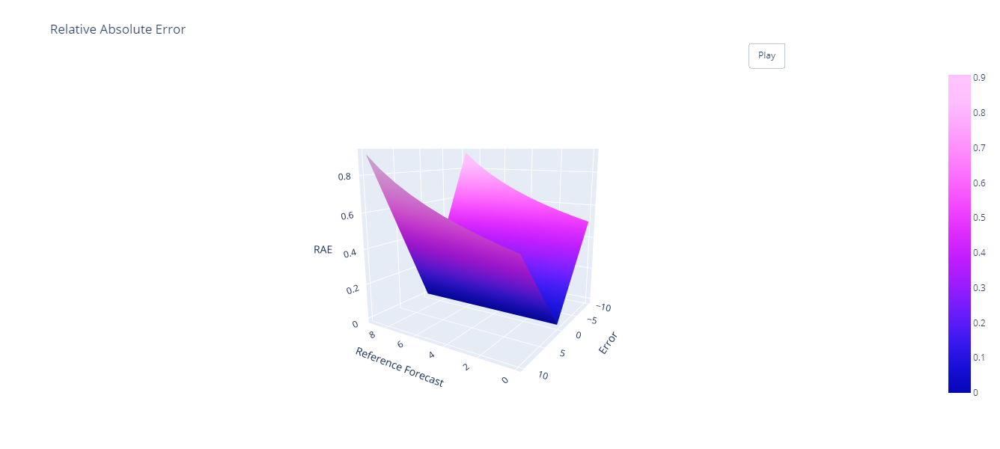

In [16]:
# x_eye = -1.25
# y_eye = 2
# z_eye = 0.5
x_eye = -1.25
y_eye = 2
z_eye = 0.5

fig = go.Figure(data=[go.Surface(z=z, x=x, y=y, colorscale="Plotly3")])
# fig.update_layout(title='Mt Bruno Elevation', autosize=False,
#                   width=500, height=500,
#                   margin=dict(l=65, r=50, b=65, t=90))
fig.update_layout(
         title='Relative Absolute Error',
         width=600,
         height=600,
         scene = {"xaxis":{"title":"Reference Forecast"},
             "yaxis":{"title":"Error"},
             "zaxis":{"title":"RAE"}},
         margin=dict(l=65, r=50, b=65, t=90),
         scene_camera_eye=dict(x=x_eye, y=y_eye, z=z_eye),
         updatemenus=[dict(type='buttons',
                  showactive=False,
                  y=1,
                  x=0.8,
                  xanchor='left',
                  yanchor='bottom',
                  pad=dict(t=45, r=10),
                  buttons=[dict(label='Play',
                                 method='animate',
                                 args=[None, dict(frame=dict(duration=5, redraw=True), 
                                                             transition=dict(duration=0),
                                                             fromcurrent=True,
                                                             mode='immediate'
                                                            )]
                                            )
                                      ]
                              )
                        ]
)

def rotate_z(x, y, z, theta):
    w = x+1j*y
    return np.real(np.exp(1j*theta)*w), np.imag(np.exp(1j*theta)*w), z

frames=[]
for t in np.arange(0, 6.26, 0.1):
    xe, ye, ze = rotate_z(x_eye, y_eye, z_eye, -t)
    frames.append(go.Frame(layout=dict(scene_camera_eye=dict(x=xe, y=ye, z=ze))))
fig.frames=frames

fig.show()

## Over and Under Forecasting

In [32]:
def calc_mrae(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    ape = abs_err/np.abs((a-f_star))
    return np.mean(ape)

def calc_mdrae(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    ape = abs_err/np.abs((a-f_star))
    return np.median(ape)

def calc_mase(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    ape = abs_err/np.mean(np.abs(a-f_star))
    return np.mean(ape)

def calc_rmae(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    abs_err_star = np.abs(a-f_star)
    return np.mean(abs_err)/np.mean(abs_err_star)

def calc_rrmse(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    sq_err = np.square(a-f)
    sq_err_star = np.square(a-f_star)
    return np.sqrt(np.mean(sq_err))/np.sqrt(np.mean(sq_err_star))

def calc_rmape(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    perc_err = np.abs(a-f)/a
    perc_err_star = np.abs(a-f_star)/a
    return np.mean(perc_err)/np.mean(perc_err_star)

def mrae_experiment(n):
    sample_df = pd.DataFrame({
        "time":np.arange(n),
        "actuals": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
        "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
    })
    baseline = calc_mrae(sample_df, fc_col="forecast_baseline", ac_col="actuals")
    low = calc_mrae(sample_df, fc_col="forecast_low", ac_col="actuals")
    high = calc_mrae(sample_df, fc_col="forecast_high", ac_col="actuals")
    return baseline, low, high

def mdrae_experiment(n):
    sample_df = pd.DataFrame({
        "time":np.arange(n),
        "actuals": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
        "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
    })
    baseline = calc_mdrae(sample_df, fc_col="forecast_baseline", ac_col="actuals")
    low = calc_mdrae(sample_df, fc_col="forecast_low", ac_col="actuals")
    high = calc_mdrae(sample_df, fc_col="forecast_high", ac_col="actuals")
    return baseline, low, high

def mase_experiment(n):
    sample_df = pd.DataFrame({
        "time":np.arange(n),
        "actuals": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
        "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
    })
    baseline = calc_mase(sample_df, fc_col="forecast_baseline", ac_col="actuals")
    low = calc_mase(sample_df, fc_col="forecast_low", ac_col="actuals")
    high = calc_mase(sample_df, fc_col="forecast_high", ac_col="actuals")
    return baseline, low, high

def rmae_experiment(n):
    sample_df = pd.DataFrame({
        "time":np.arange(n),
        "actuals": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
        "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
    })
    baseline = calc_rmae(sample_df, fc_col="forecast_baseline", ac_col="actuals")
    low = calc_rmae(sample_df, fc_col="forecast_low", ac_col="actuals")
    high = calc_rmae(sample_df, fc_col="forecast_high", ac_col="actuals")
    return baseline, low, high

def rrmse_experiment(n):
    sample_df = pd.DataFrame({
        "time":np.arange(n),
        "actuals": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
        "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
    })
    baseline = calc_rrmse(sample_df, fc_col="forecast_baseline", ac_col="actuals")
    low = calc_rrmse(sample_df, fc_col="forecast_low", ac_col="actuals")
    high = calc_rrmse(sample_df, fc_col="forecast_high", ac_col="actuals")
    return baseline, low, high

def rmape_experiment(n):
    sample_df = pd.DataFrame({
        "time":np.arange(n),
        "actuals": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
        "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
        "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
    })
    baseline = calc_rmape(sample_df, fc_col="forecast_baseline", ac_col="actuals")
    low = calc_rmape(sample_df, fc_col="forecast_low", ac_col="actuals")
    high = calc_rmape(sample_df, fc_col="forecast_high", ac_col="actuals")
    return baseline, low, high

In [33]:
results = []
for i in range(10000):
    baseline, low, high = mrae_experiment(25)
    baseline_d, low_d, high_d = mdrae_experiment(25)
    baseline_s, low_s, high_s = mase_experiment(25)
    baseline_m, low_m, high_m = rmae_experiment(25)
    baseline_r, low_r, high_r = rrmse_experiment(25)
    baseline_p, low_p, high_p = rmape_experiment(25)
    results.append({
        "baseline_mrae": baseline,
        "low_mrae": low,
        "high_mrae": high,
        "baseline_mdrae": baseline_d,
        "low_mdrae": low_d,
        "high_mdrae": high_d,
        "baseline_mase": baseline_s,
        "low_mase": low_s,
        "high_mase": high_s,
        "baseline_rmae": baseline_m,
        "low_rmae": low_m,
        "high_rmae": high_m,
        "baseline_rrmse": baseline_r,
        "low_rrmse": low_r,
        "high_rrmse": high_r,
        "baseline_rmape": baseline_p,
        "low_rmape": low_p,
        "high_rmape": high_p,
    })

In [34]:
results_df = pd.DataFrame(results)

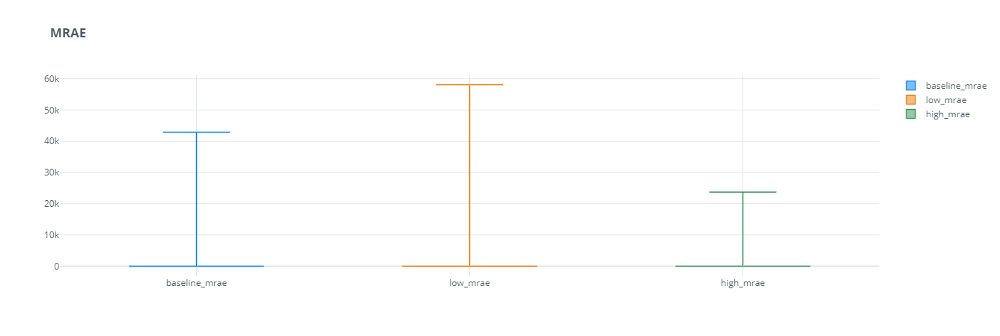

In [23]:
results_df[['baseline_mrae',"low_mrae","high_mrae"]].iplot(kind='box',theme="white", colorscale="polar", title="<b>MRAE</b>")

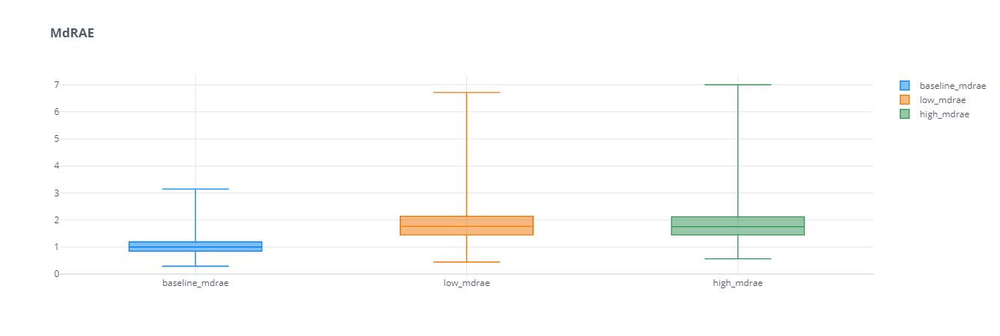

In [35]:
results_df[['baseline_mdrae',"low_mdrae","high_mdrae"]].iplot(kind='box',theme="white", colorscale="polar", title="<b>MdRAE</b>")

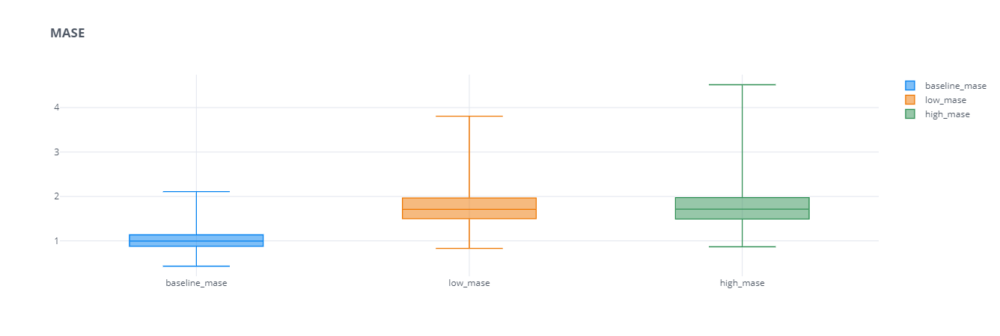

In [27]:
results_df[['baseline_mase',"low_mase","high_mase"]].iplot(kind='box',theme="white", colorscale="polar",title="<b>MASE</b>")

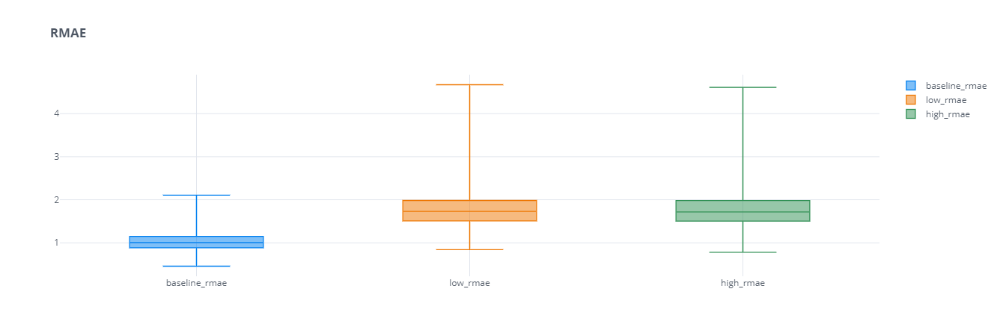

In [28]:
results_df[['baseline_rmae',"low_rmae","high_rmae"]].iplot(kind='box',theme="white", colorscale="polar", title="<b>RMAE</b>")

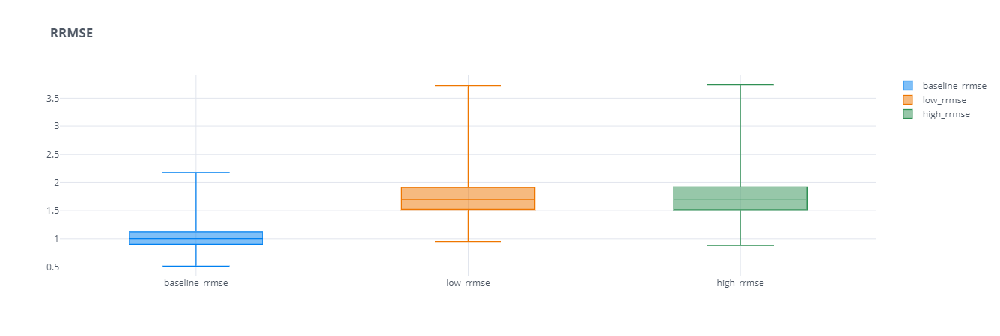

In [29]:
results_df[['baseline_rrmse',"low_rrmse","high_rrmse"]].iplot(kind='box',theme="white", colorscale="polar", title="<b>RRMSE</b>")

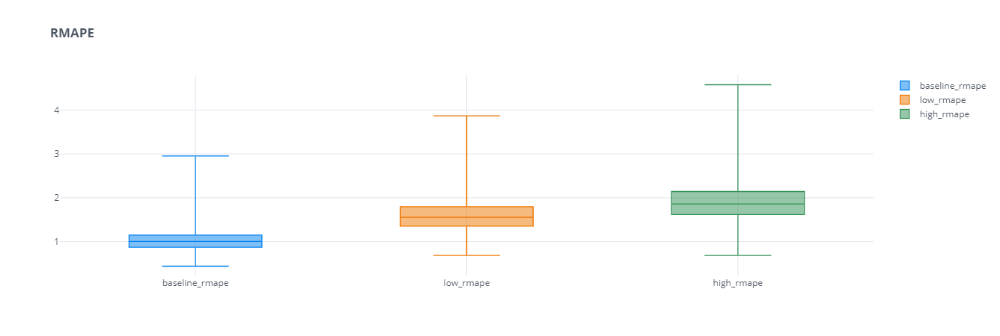

In [30]:
results_df[['baseline_rmape',"low_rmape","high_rmape"]].iplot(kind='box',theme="white", colorscale="polar", title="<b>RMAPE</b>")

In [19]:
n = 25
sample_df = pd.DataFrame({
    "time":np.arange(n),
    "actuals": np.random.randint(2,5,n)+np.random.random(n),
    "forecast_baseline": np.random.randint(2,5,n)+np.random.random(n),
    "forecast_low": np.random.randint(0,4,n)+np.random.random(n),
    "forecast_high": np.random.randint(3,7,n)+np.random.random(n),
})

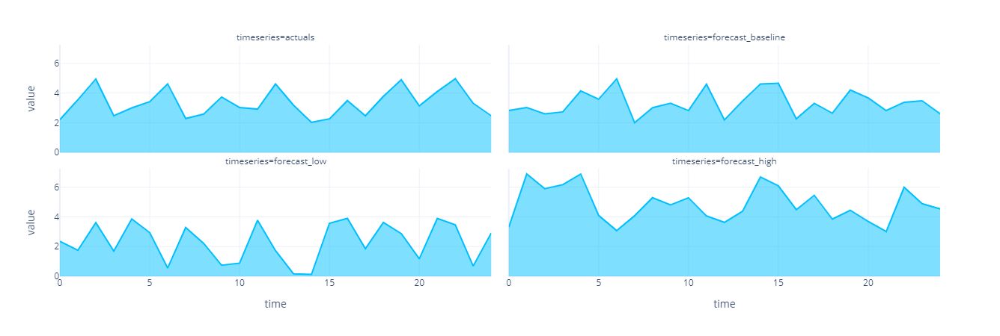

In [20]:
px.area(pd.melt(sample_df, id_vars=["time"], var_name="timeseries"), 
        y="value", 
        x="time", 
        facet_col="timeseries", 
        facet_col_wrap=2,
       template="plotly_white", color_discrete_sequence=["DeepSkyBlue"])

## Outlier Influence

In [37]:

def calc_mrae(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    ape = abs_err/np.abs((a-f_star))
    return np.mean(ape)

def calc_mase(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    ape = abs_err/np.mean(np.abs(a-f_star))
    return np.mean(ape)

def calc_rmae(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    abs_err = np.abs(a-f)
    abs_err_star = np.abs(a-f_star)
    return np.mean(abs_err)/np.mean(abs_err_star)

def calc_rrmse(df, fc_col, ac_col):
    a = df[ac_col].values[1:]
    f = df[fc_col].values[1:]
    f_star = df[ac_col].shift(1).values[1:]
    sq_err = np.square(a-f)
    sq_err_star = np.square(a-f_star)
    return np.sqrt(np.mean(sq_err))/np.sqrt(np.mean(sq_err_star))

In [38]:
ts_df = pd.read_csv("data/synthetic_ts.csv")

unique_scales = ts_df.scale.unique()

hist, bin_edges = np.histogram(unique_scales,bins=10)

chunks = []
for i in range(1, len(bin_edges)):
    idx = np.where(np.logical_and(unique_scales>=bin_edges[i-1], unique_scales<=bin_edges[i]))
    chunks.append(unique_scales[idx])

In [39]:
def inject_outlier(ts, scale=1.2, n_outliers=2, keep_actuals_fixed=True, keep_forecast_fixed=True):
    if n_outliers>0:
        if n_outliers<1:
            n_outliers = int(n_outliers*len(ts))
        idxs = random.choices(np.arange(len(ts)),k=n_outliers)
#         display(ts.iloc[idxs])
        for idx in idxs:
            _ts = ts.iloc[idx]
            error = _ts['scale']*scale
            y = _ts['y'].item()
            yhat = _ts['yhat'].item()
            if keep_actuals_fixed:
                choice = "yhat"
            elif keep_forecast_fixed:
                choice = 'y'
            else:
                choice = random.choice(["y","yhat"])
            if y>yhat:
                if choice == 'y':
                    idx.iloc[idx,1] = ts.iloc[idx,1]+error
                else:
                    ts.iloc[idx,2] = ts.iloc[idx,2]-error
            else:
                if choice == 'y':
                    ts.iloc[idx,1] = ts.iloc[idx,1]-error
                else:
                    ts.iloc[idx,2] = ts.iloc[idx,2]+error
#         display(ts.iloc[idxs])
        return ts, idxs
    else:
        return ts, []


In [40]:
def sample_ts(ts_df,chunks):
    chunk = random.choice(np.arange(len(chunks)))
    chunk = chunks[chunk]
    scale = chunk.mean()
    ts_scale_df = ts_df[ts_df.scale.isin(chunk)].copy()
    ts_ids = ts_scale_df.ts_id.values.tolist()
    ts_scale_df.set_index("ts_id", inplace=True)
    ts = ts_scale_df.xs(random.choice(ts_ids))
    return ts

def outlier_experiment(ts, n_outliers, scale_outliers=1.2):
    
    ts, _ = inject_outlier(ts,scale=scale_outliers,n_outliers=n_outliers)
    res_dict = {
            "n_outliers":n_outliers,
            "scale_outliers": scale_outliers,
            "mrae": calc_mrae(ts, fc_col="yhat", ac_col="y"),
            "mase": calc_mase(ts,fc_col="yhat", ac_col="y"),
            "rmae": calc_rmae(ts,fc_col="yhat", ac_col="y"),
            "rrmse" : calc_rrmse(ts, fc_col="yhat", ac_col="y"),
    }
    return res_dict
    

In [41]:
N = 100
df_l = []
ts = sample_ts(ts_df, chunks)
for i in tqdm(range(N), total=N):
    res_l=[]
    for outlier_perc in np.arange(0,0.5,0.1):
        for scale in np.arange(1,2,0.1):
            res_l.append(outlier_experiment(ts.copy(), n_outliers=outlier_perc, scale_outliers=scale))
    df = pd.DataFrame(res_l)
    df['exp_id'] = i
    df_l.append(df)

In [42]:
res_df = pd.concat(df_l)
res_df.head()

,n_outliers,scale_outliers,mrae,mase,rmae,rrmse,exp_id
0,0.0,1.0,118.843945,22.128173,22.128173,18.207052,0
1,0.0,1.1,118.843945,22.128173,22.128173,18.207052,0
2,0.0,1.2,118.843945,22.128173,22.128173,18.207052,0
3,0.0,1.3,118.843945,22.128173,22.128173,18.207052,0
4,0.0,1.4,118.843945,22.128173,22.128173,18.207052,0


In [60]:
n_outlier_df = res_df[res_df.scale_outliers==1.5000000000000004]

n_outlier_df = n_outlier_df.groupby("n_outliers").mean().reset_index()

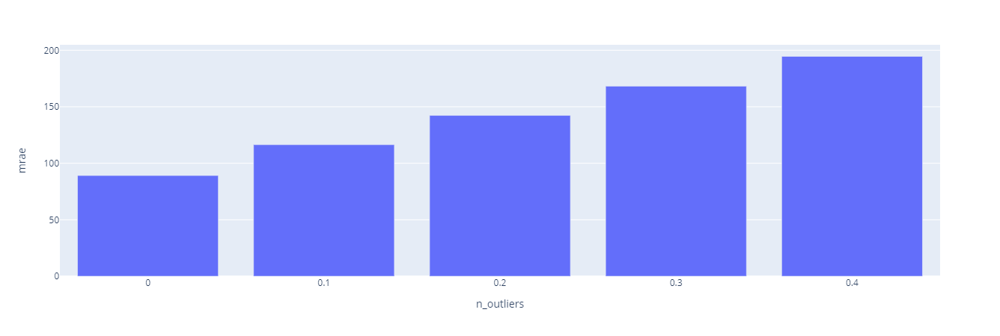

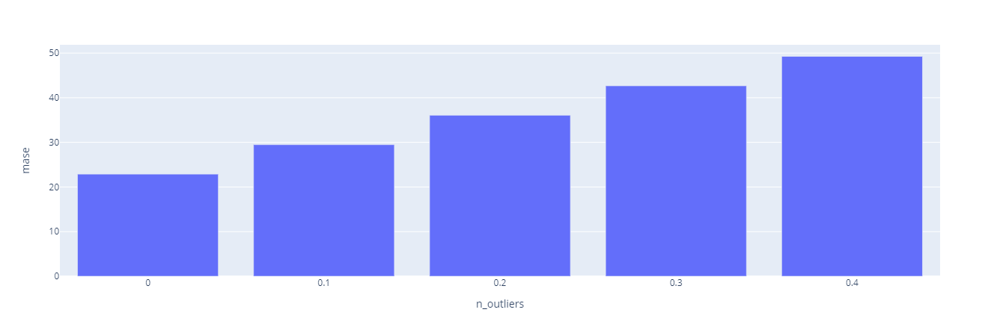

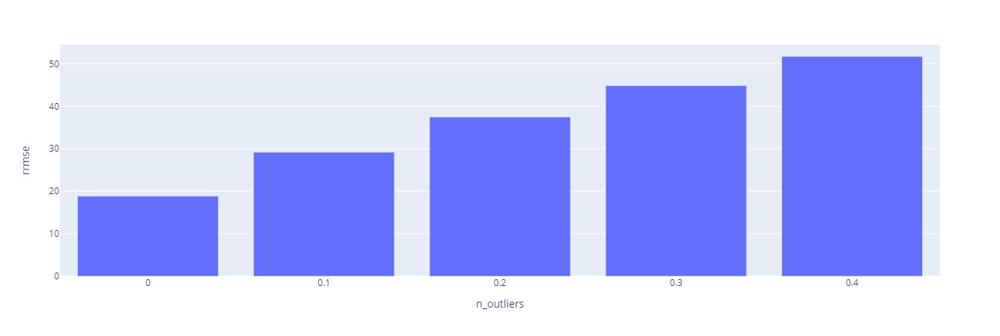

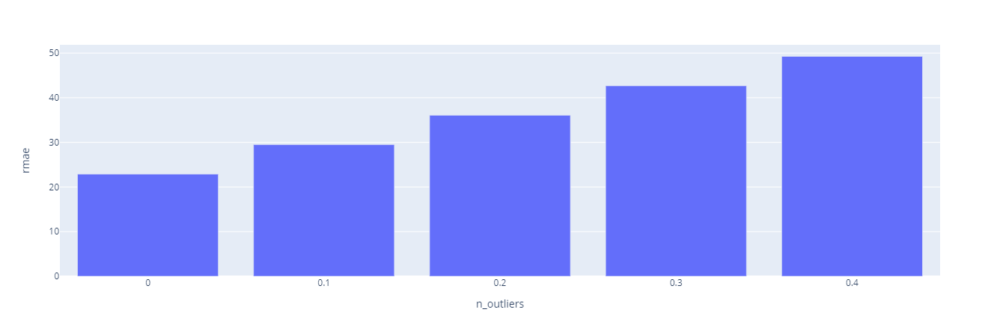

In [61]:
for col in ['mrae', 'mase', "rrmse", "rmae"]:
    fig = px.bar(n_outlier_df, x="n_outliers", y=col)
    fig.show()

In [62]:
scale_outlier_df = res_df[res_df.n_outliers==0.4]

scale_outlier_df = scale_outlier_df.groupby("scale_outliers").mean().reset_index()
# scale_outlier_df['diff_mae_rmse'] = scale_outlier_df['mae'] = scale_outlier_df['rmse']
# scale_outlier_df['diff_mape_smape'] = scale_outlier_df['mape'] = scale_outlier_df['smape']

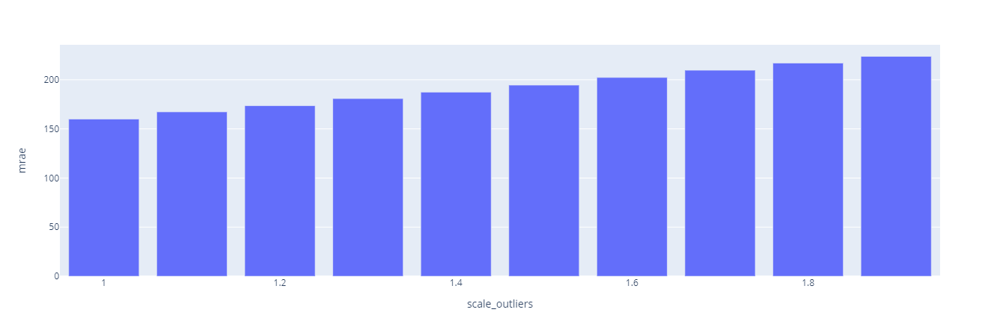

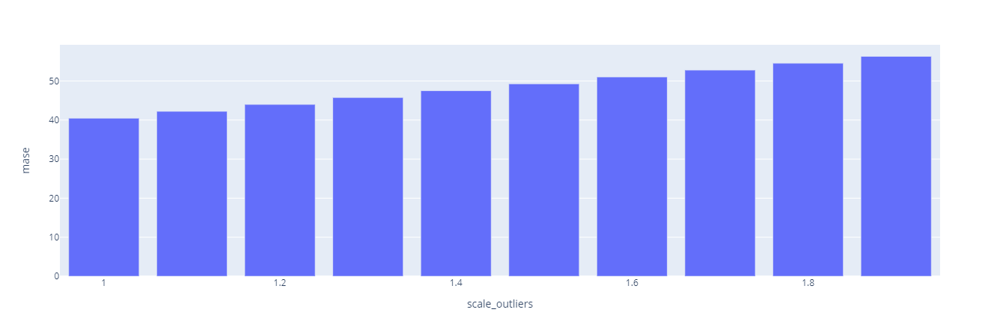

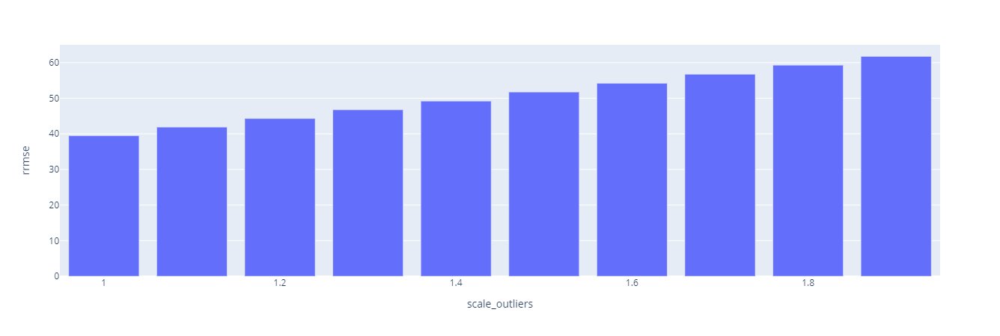

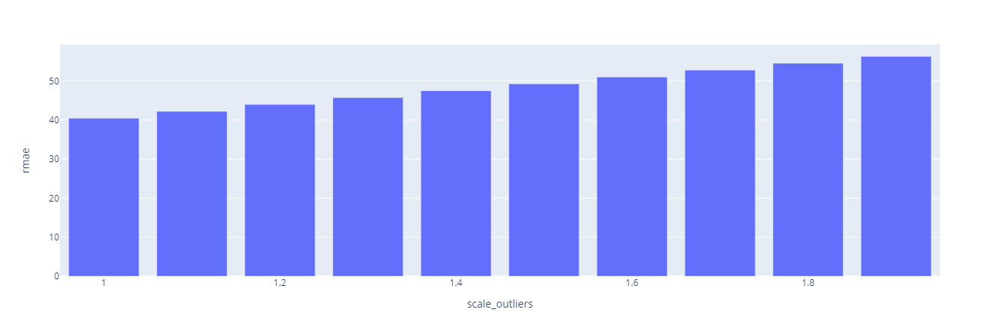

In [63]:
for col in ['mrae', 'mase', "rrmse", "rmae"]:
    fig = px.bar(scale_outlier_df, x="scale_outliers", y=col)
    fig.show()

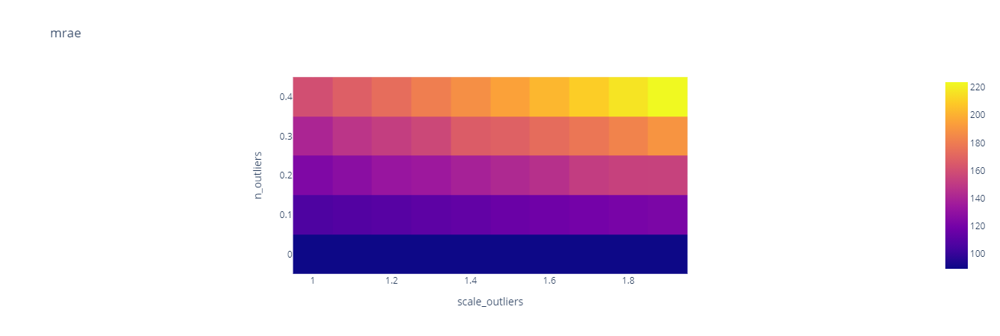

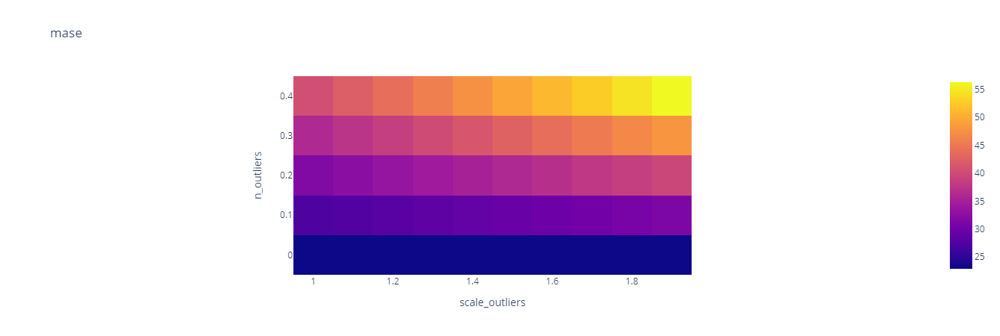

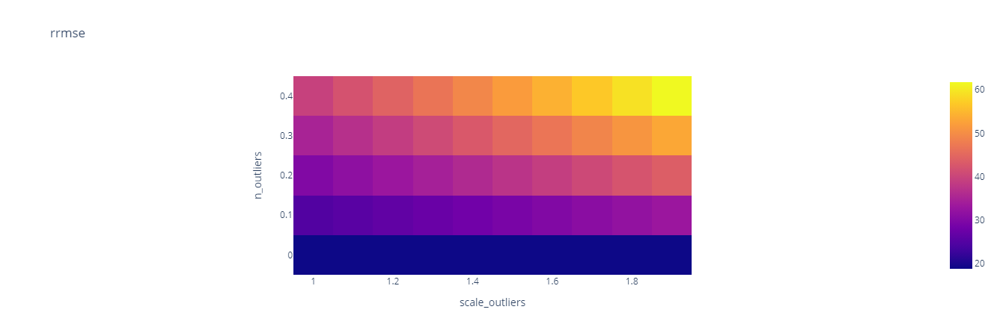

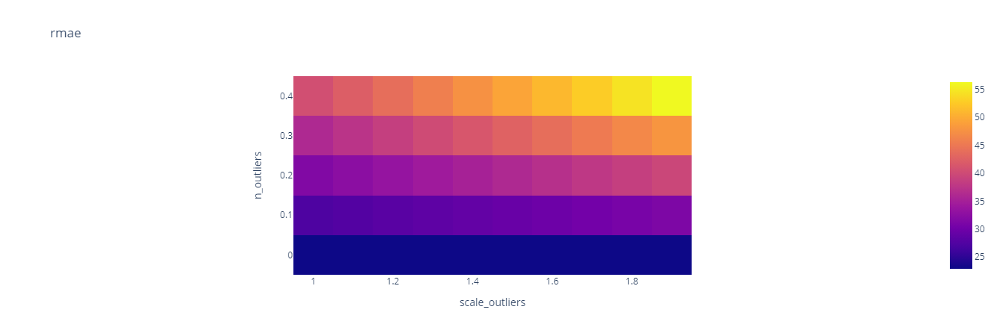

In [64]:
for col in ['mrae', 'mase', "rrmse", "rmae"]:
    plot_df = pd.pivot_table(res_df, index="n_outliers", columns="scale_outliers", values=col)
    fig = px.imshow(plot_df, title=col)
    fig.update_yaxes(autorange=True)
    fig.show()

In [548]:
plot_df

scale_outliers,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9
n_outliers,,,,,,,,,,
0.0,0.869652,0.869652,0.869652,0.869652,0.869652,0.869652,0.869652,0.869652,0.869652,0.869652
0.1,0.923659,0.922931,0.923445,0.923507,0.923115,0.923303,0.923142,0.923302,0.923372,0.923158
0.2,0.973722,0.972547,0.973407,0.973445,0.973224,0.972845,0.973693,0.973810,0.973570,0.973277
0.3,1.019876,1.019328,1.019727,1.019718,1.020654,1.019849,1.019582,1.020700,1.019481,1.020572
0.4,1.063509,1.063191,1.065392,1.064313,1.065197,1.063462,1.064332,1.063422,1.063142,1.064816


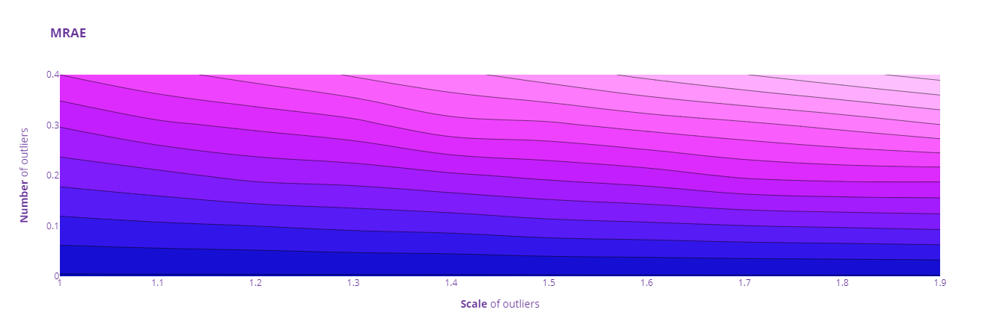

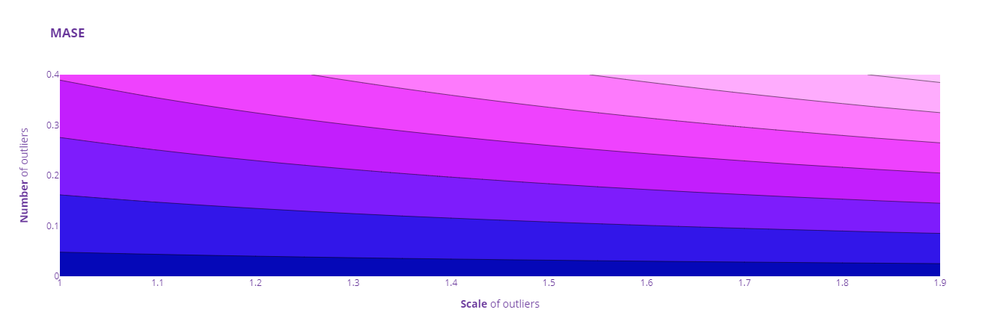

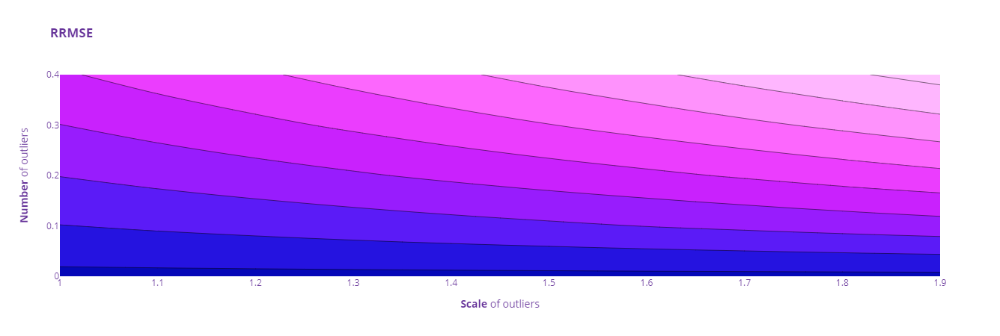

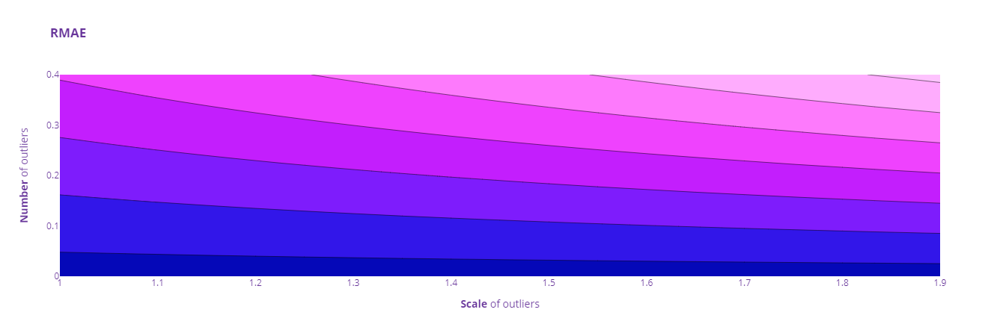

In [68]:
for col in ['mrae', 'mase', "rrmse", "rmae"]:
    plot_df = pd.pivot_table(res_df, index="n_outliers", columns="scale_outliers", values=col)
    fig = go.Figure(data =
        go.Contour(
            z=plot_df.values,
            x=plot_df.columns, # horizontal axis
            y=plot_df.index, # vertical axis
            showscale = False,
            colorscale='Plotly3',
        ))

    fig.update_layout(
        title=f"<b>{col.upper()}<b>",
        yaxis_title="<b>Number</b> of outliers",
        xaxis_title="<b>Scale</b> of outliers",
        font=dict(
    #         family="Courier New, monospace",
    #         size=18,
            color="RebeccaPurple"
        )
    )

    fig.show()

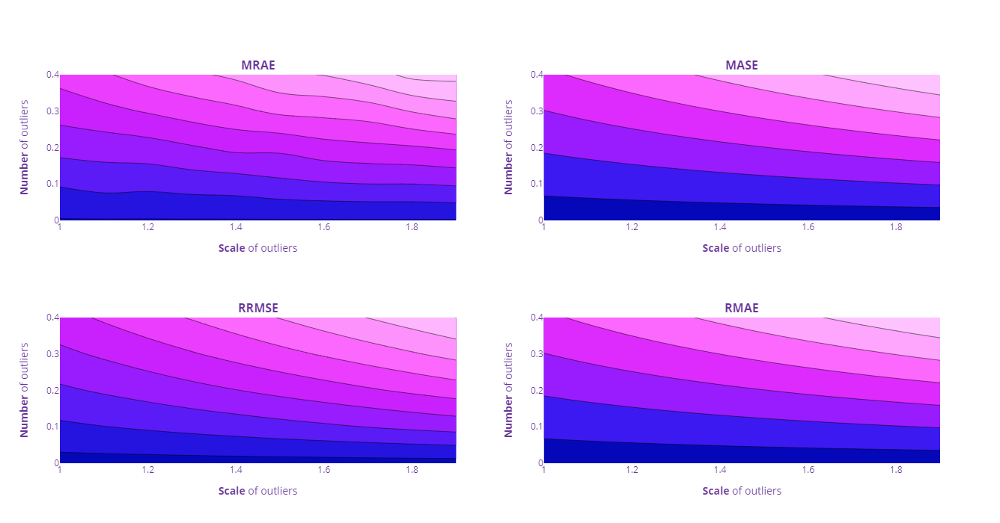

In [50]:
plots={}
for col in ['mrae', 'mase', "rrmse", "rmae"]:
    plot_df = pd.pivot_table(res_df, index="n_outliers", columns="scale_outliers", values=col)
#     plot_df = plot_df/plot_df.iloc[0]
    f = go.Contour(
            z=plot_df.values,
            x=plot_df.columns, # horizontal axis
            y=plot_df.index, # vertical axis
            showscale = False,
            colorscale='Plotly3',
        )
    plots[col] = f

# Initialize figure with subplots
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("<b>MRAE</b>", "<b>MASE</b>", "<b>RRMSE</b>", "<b>RMAE</b>"),
)    


fig.add_trace(plots['mrae'],
             row=1, col=1)
fig.update_yaxes(title_text="<b>Number</b> of outliers", row=1, col=1)
fig.update_xaxes(title_text="<b>Scale</b> of outliers", row=1, col=1)
fig.add_trace(plots['mase'],
             row=1, col=2)
fig.update_yaxes(title_text="<b>Number</b> of outliers", row=1, col=2)
fig.update_xaxes(title_text="<b>Scale</b> of outliers", row=1, col=2)
fig.add_trace(plots['rrmse'],
             row=2, col=1)
fig.update_yaxes(title_text="<b>Number</b> of outliers", row=2, col=1)
fig.update_xaxes(title_text="<b>Scale</b> of outliers", row=2, col=1)
fig.add_trace(plots['rmae'],
             row=2, col=2)
fig.update_yaxes(title_text="<b>Number</b> of outliers", row=2, col=2)
fig.update_xaxes(title_text="<b>Scale</b> of outliers", row=2, col=2)

fig.update_layout(
    height=700,width=900,
        font=dict(
            color="RebeccaPurple"
        )
    )
fig.show()

In [47]:
for col in ['mrae', 'mase', "rrmse", "rmae"]:
    plot_df = pd.pivot_table(res_df, index="n_outliers", columns="scale_outliers", values=col)
    plot_df = plot_df/plot_df.iloc[0]
    display(plot_df)

scale_outliers,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9
n_outliers,,,,,,,,,,
0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
0.1,1.193001,1.234773,1.224086,1.248700,1.262581,1.305332,1.330819,1.345698,1.347136,1.366334
0.2,1.404689,1.420935,1.444783,1.498892,1.554797,1.553663,1.616591,1.644743,1.666663,1.704117
0.3,1.583265,1.637182,1.696888,1.761323,1.812331,1.883185,1.903677,1.933684,2.027205,2.103747
0.4,1.742414,1.831545,1.923697,1.988442,2.054981,2.155371,2.194457,2.281109,2.399906,2.411969


scale_outliers,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9
n_outliers,,,,,,,,,,
0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
0.1,1.192517,1.211783,1.231004,1.250289,1.269476,1.288785,1.307994,1.327290,1.346506,1.365794
0.2,1.385067,1.423581,1.462008,1.500613,1.539046,1.577550,1.616042,1.654511,1.693096,1.731550
0.3,1.577556,1.635290,1.693060,1.750841,1.808523,1.866264,1.924154,1.981891,2.039614,2.097344
0.4,1.770120,1.847102,1.924039,2.001086,2.078140,2.155099,2.232010,2.309249,2.385879,2.463037


scale_outliers,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9
n_outliers,,,,,,,,,,
0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
0.1,1.323580,1.366638,1.410986,1.457999,1.504325,1.554581,1.602673,1.654056,1.705574,1.756899
0.2,1.603066,1.679601,1.757119,1.837324,1.914383,1.995987,2.077916,2.161686,2.245141,2.327622
0.3,1.860028,1.964434,2.069268,2.175687,2.283811,2.391888,2.498929,2.608669,2.719836,2.830500
0.4,2.102024,2.233835,2.363588,2.492298,2.622928,2.757274,2.891349,3.027521,3.158462,3.297313


scale_outliers,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9
n_outliers,,,,,,,,,,
0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
0.1,1.192517,1.211783,1.231004,1.250289,1.269476,1.288785,1.307994,1.327290,1.346506,1.365794
0.2,1.385067,1.423581,1.462008,1.500613,1.539046,1.577550,1.616042,1.654511,1.693096,1.731550
0.3,1.577556,1.635290,1.693060,1.750841,1.808523,1.866264,1.924154,1.981891,2.039614,2.097344
0.4,1.770120,1.847102,1.924039,2.001086,2.078140,2.155099,2.232010,2.309249,2.385879,2.463037


In [45]:
plot_df/plot_df.iloc[0]

scale_outliers,1.0,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9
n_outliers,,,,,,,,,,
0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
0.1,1.192517,1.211783,1.231004,1.250289,1.269476,1.288785,1.307994,1.327290,1.346506,1.365794
0.2,1.385067,1.423581,1.462008,1.500613,1.539046,1.577550,1.616042,1.654511,1.693096,1.731550
0.3,1.577556,1.635290,1.693060,1.750841,1.808523,1.866264,1.924154,1.981891,2.039614,2.097344
0.4,1.770120,1.847102,1.924039,2.001086,2.078140,2.155099,2.232010,2.309249,2.385879,2.463037
